### Random forest

In [1]:
import pandas as pd
import numpy as np
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn import tree
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score, confusion_matrix,roc_auc_score, roc_curve


In [2]:
from pandas_profiling import ProfileReport

In [3]:
df=pd.read_csv("winequality-red.csv")
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [4]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [5]:
X=df.drop(columns='quality')
Y=df.quality

In [6]:
x_train,x_test,y_train,y_test=train_test_split(X,Y,test_size=0.20)

In [7]:
rf=RandomForestClassifier()
rf.fit(x_train,y_train)

RandomForestClassifier()

In [8]:
rf.score(x_test,y_test)

0.71875

In [9]:
rf=RandomForestClassifier(n_estimators=5)
rf.fit(x_train,y_train)

RandomForestClassifier(n_estimators=5)

In [10]:
rf.estimators_

[DecisionTreeClassifier(max_features='auto', random_state=1587122541),
 DecisionTreeClassifier(max_features='auto', random_state=1852889532),
 DecisionTreeClassifier(max_features='auto', random_state=10590920),
 DecisionTreeClassifier(max_features='auto', random_state=1632808950),
 DecisionTreeClassifier(max_features='auto', random_state=716486233)]

In [11]:
rf.estimators_[0]

DecisionTreeClassifier(max_features='auto', random_state=1587122541)

[Text(724.9157487947258, 1060.02, 'X[6] <= 64.5\ngini = 0.641\nsamples = 835\nvalue = [6, 54, 552, 506, 154, 7]'),
 Text(410.64725037755574, 1005.6600000000001, 'X[10] <= 10.55\ngini = 0.659\nsamples = 631\nvalue = [6, 47, 334, 425, 142, 7]'),
 Text(171.5045379298327, 951.3000000000001, 'X[9] <= 0.545\ngini = 0.613\nsamples = 354\nvalue = [5, 33, 266, 193, 36, 1]'),
 Text(81.28856877323419, 896.94, 'X[1] <= 0.825\ngini = 0.445\nsamples = 94\nvalue = [1, 20, 102, 15, 3, 0]'),
 Text(44.339219330855016, 842.58, 'X[4] <= 0.069\ngini = 0.405\nsamples = 81\nvalue = [1, 12, 93, 14, 3, 0]'),
 Text(29.040892193308547, 788.22, 'X[6] <= 48.5\ngini = 0.623\nsamples = 19\nvalue = [0, 4, 15, 5, 3, 0]'),
 Text(24.892193308550183, 733.8600000000001, 'X[5] <= 23.0\ngini = 0.703\nsamples = 17\nvalue = [0, 4, 9, 5, 3, 0]'),
 Text(20.74349442379182, 679.5, 'X[6] <= 28.0\ngini = 0.67\nsamples = 16\nvalue = [0, 2, 9, 5, 3, 0]'),
 Text(12.446096654275092, 625.1400000000001, 'X[3] <= 1.3\ngini = 0.578\nsample

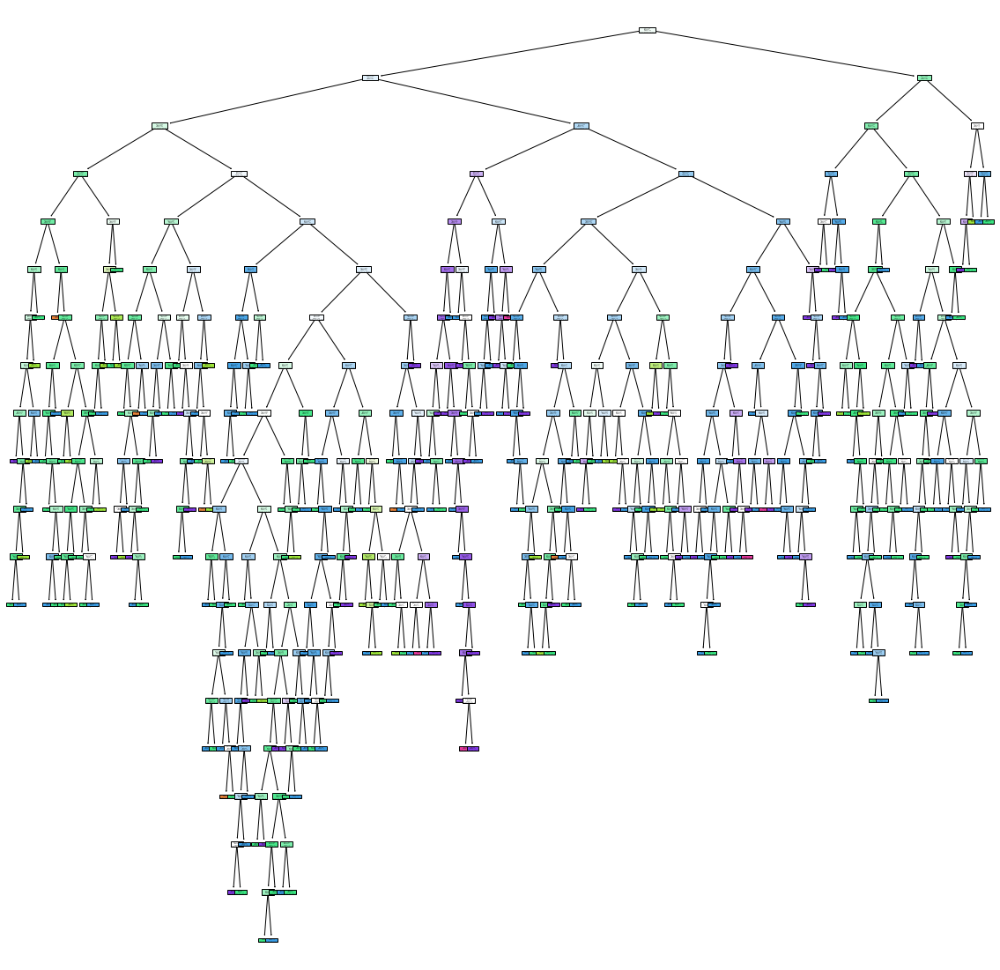

In [12]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.figure(figsize=(20,20))
tree.plot_tree(rf.estimators_[0],filled=True)

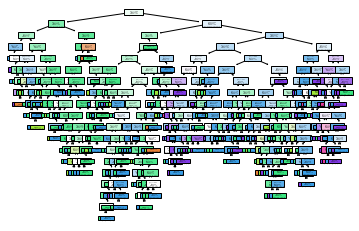

In [13]:
for i in range(len(rf.estimators_)):
    tree.plot_tree(rf.estimators_[i], filled=True)

### Hyperparameter tuning

In [14]:
grid_param={'n_estimators':[5,10,50,100,150],
           "criterion":['gini','entropy'],
           "max_depth":range(10),
           "min_samples_leaf":range(10)}

In [15]:
rf_grid=GridSearchCV(estimator=RandomForestClassifier(),param_grid=grid_param,
                     cv=5,n_jobs=-1,verbose=1)

In [16]:
rf_grid.fit(x_train,y_train)

Fitting 5 folds for each of 1000 candidates, totalling 5000 fits


C:\Users\samskruthi HD\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:918: UserWarning: One or more of the test scores are non-finite: [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan 0.55901348 0.57308824 0.56763787 0.56450061 0.56841299
 0.56839461 0.56059436 0.57466605 0.58012868 0.57544424 0.5605913
 0.56137868 0.57856311 0.57544424 0.57543811 0.56059436 0.56840074
 0.57231618 0.5746538  0.57388787 0.55199755 0

GridSearchCV(cv=5, estimator=RandomForestClassifier(), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': range(0, 10),
                         'min_samples_leaf': range(0, 10),
                         'n_estimators': [5, 10, 50, 100, 150]},
             verbose=1)

In [17]:
#finding best parameter
rf_grid.best_params_

{'criterion': 'gini',
 'max_depth': 9,
 'min_samples_leaf': 1,
 'n_estimators': 100}

In [19]:
rf_cv=RandomForestClassifier(criterion='gini',max_depth=9,min_samples_leaf=1,n_estimators=100)

In [20]:
rf_cv.fit(x_train,y_train)

RandomForestClassifier(max_depth=9)

In [21]:
#test score
rf_cv.score(x_test,y_test)

0.690625

In [22]:
#train score
rf_cv.score(x_train,y_train)

0.9132134480062549

[Text(157.77501539408868, 206.56799999999998, 'X[10] <= 10.017\ngini = 0.639\nsamples = 811\nvalue = [9, 42, 535, 526, 159, 8]'),
 Text(67.41354679802956, 184.824, 'X[9] <= 0.575\ngini = 0.508\nsamples = 386\nvalue = [6, 25, 384, 173, 14, 0]'),
 Text(32.572906403940884, 163.07999999999998, 'X[4] <= 0.069\ngini = 0.347\nsamples = 180\nvalue = [3, 18, 225, 37, 0, 0]'),
 Text(12.369458128078819, 141.336, 'X[5] <= 13.5\ngini = 0.565\nsamples = 26\nvalue = [1, 2, 20, 16, 0, 0]'),
 Text(8.246305418719212, 119.592, 'X[1] <= 0.585\ngini = 0.48\nsamples = 14\nvalue = [0, 0, 10, 15, 0, 0]'),
 Text(4.947783251231527, 97.848, 'X[10] <= 9.95\ngini = 0.26\nsamples = 6\nvalue = [0, 0, 2, 11, 0, 0]'),
 Text(3.298522167487685, 76.10399999999998, 'X[9] <= 0.55\ngini = 0.153\nsamples = 5\nvalue = [0, 0, 1, 11, 0, 0]'),
 Text(1.6492610837438424, 54.360000000000014, 'gini = 0.0\nsamples = 4\nvalue = [0, 0, 0, 11, 0, 0]'),
 Text(4.947783251231527, 54.360000000000014, 'gini = 0.0\nsamples = 1\nvalue = [0, 0,

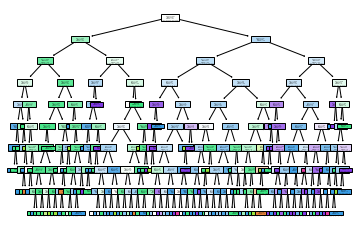

In [23]:
tree.plot_tree(rf_cv[0],filled=True)

[Text(331.52208533653845, 774.63, 'chlorides <= 0.069\ngini = 0.633\nsamples = 825\nvalue = [3, 40, 531, 543, 150, 12]'),
 Text(83.3311298076923, 693.09, 'alcohol <= 9.95\ngini = 0.636\nsamples = 203\nvalue = [0, 9, 76, 158, 63, 3]'),
 Text(30.850961538461537, 611.55, 'alcohol <= 9.35\ngini = 0.515\nsamples = 42\nvalue = [0, 2, 35, 20, 1, 0]'),
 Text(10.73076923076923, 530.01, 'fixed acidity <= 7.2\ngini = 0.494\nsamples = 10\nvalue = [0, 2, 4, 12, 0, 0]'),
 Text(5.365384615384615, 448.47, 'gini = 0.0\nsamples = 2\nvalue = [0, 0, 3, 0, 0, 0]'),
 Text(16.096153846153847, 448.47, 'residual sugar <= 8.95\ngini = 0.338\nsamples = 8\nvalue = [0, 2, 1, 12, 0, 0]'),
 Text(10.73076923076923, 366.93, 'volatile acidity <= 0.235\ngini = 0.245\nsamples = 7\nvalue = [0, 2, 0, 12, 0, 0]'),
 Text(5.365384615384615, 285.39, 'gini = 0.0\nsamples = 1\nvalue = [0, 2, 0, 0, 0, 0]'),
 Text(16.096153846153847, 285.39, 'gini = 0.0\nsamples = 6\nvalue = [0, 0, 0, 12, 0, 0]'),
 Text(21.46153846153846, 366.93, 

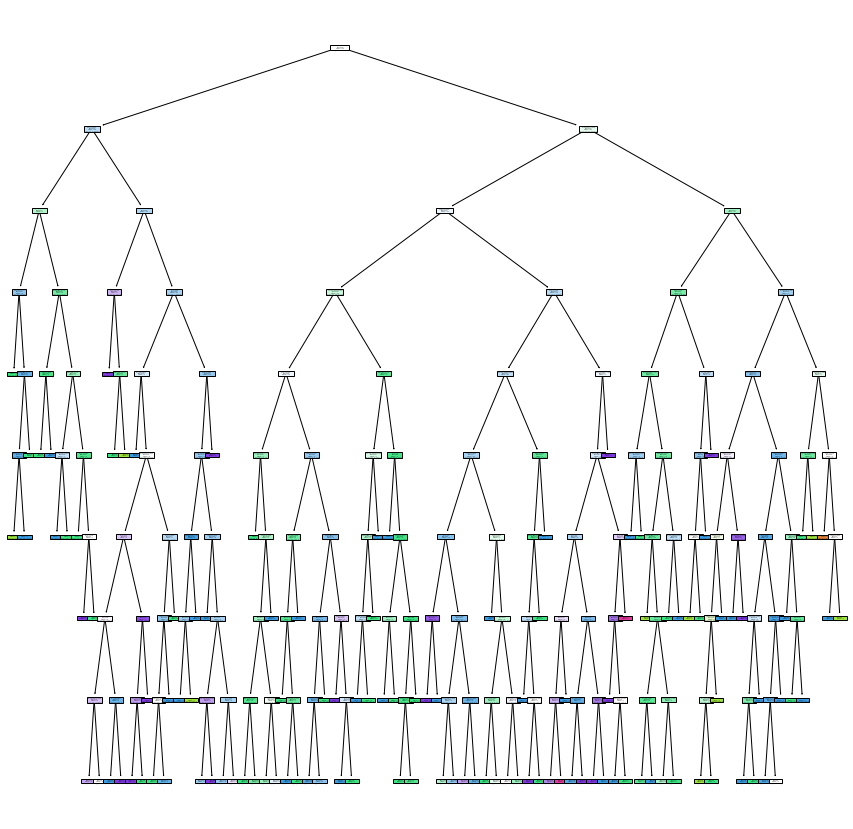

In [28]:
plt.figure(figsize=(15,15))
tree.plot_tree(rf_cv[1],filled=True, feature_names=X.columns)

In [25]:
rf_cv.estimators_

[DecisionTreeClassifier(max_depth=9, max_features='auto', random_state=246528636),
 DecisionTreeClassifier(max_depth=9, max_features='auto',
                        random_state=1753378911),
 DecisionTreeClassifier(max_depth=9, max_features='auto',
                        random_state=1603871494),
 DecisionTreeClassifier(max_depth=9, max_features='auto', random_state=797618670),
 DecisionTreeClassifier(max_depth=9, max_features='auto', random_state=752368160),
 DecisionTreeClassifier(max_depth=9, max_features='auto', random_state=358308373),
 DecisionTreeClassifier(max_depth=9, max_features='auto', random_state=825013753),
 DecisionTreeClassifier(max_depth=9, max_features='auto', random_state=613354291),
 DecisionTreeClassifier(max_depth=9, max_features='auto', random_state=251278974),
 DecisionTreeClassifier(max_depth=9, max_features='auto',
                        random_state=1818689890),
 DecisionTreeClassifier(max_depth=9, max_features='auto', random_state=524610098),
 DecisionTre

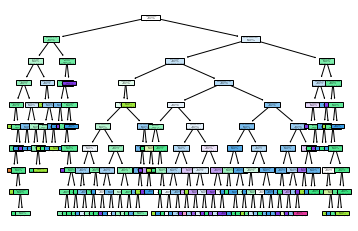

In [30]:
for i in range(len(rf_cv.estimators_)):
    tree.plot_tree(rf_cv.estimators_[i], filled=True,feature_names=X.columns)

In [31]:
y_test_pred=rf_cv.predict(x_test)
y_test_pred

array([5, 6, 6, 6, 5, 6, 5, 5, 5, 6, 5, 6, 5, 6, 6, 6, 7, 6, 5, 5, 6, 5,
       7, 6, 5, 6, 5, 6, 6, 5, 6, 6, 5, 6, 7, 5, 6, 6, 7, 5, 6, 5, 6, 6,
       5, 5, 6, 6, 5, 5, 5, 7, 5, 5, 6, 5, 5, 5, 6, 5, 6, 6, 6, 6, 5, 5,
       6, 6, 5, 6, 5, 5, 5, 7, 6, 5, 5, 5, 6, 6, 5, 6, 5, 5, 6, 5, 5, 6,
       5, 6, 6, 6, 6, 5, 7, 6, 6, 5, 5, 6, 5, 7, 6, 6, 5, 6, 6, 7, 5, 6,
       6, 5, 6, 6, 5, 6, 5, 5, 5, 6, 5, 6, 6, 6, 6, 5, 6, 7, 5, 5, 6, 5,
       6, 5, 5, 5, 6, 7, 7, 6, 5, 5, 6, 7, 5, 7, 6, 5, 5, 5, 6, 5, 5, 6,
       6, 6, 6, 6, 6, 6, 7, 5, 5, 6, 5, 7, 6, 5, 5, 6, 5, 5, 6, 5, 7, 5,
       7, 5, 6, 6, 7, 5, 7, 5, 6, 5, 7, 5, 6, 6, 7, 6, 6, 6, 6, 7, 5, 5,
       6, 6, 5, 6, 5, 6, 5, 7, 5, 5, 5, 5, 5, 5, 5, 6, 5, 5, 6, 6, 6, 6,
       6, 6, 7, 5, 5, 5, 5, 6, 5, 6, 7, 5, 6, 6, 6, 5, 5, 5, 6, 5, 5, 5,
       6, 5, 5, 6, 6, 5, 6, 5, 6, 6, 5, 6, 6, 5, 6, 5, 5, 6, 7, 5, 6, 5,
       6, 5, 6, 6, 5, 6, 6, 6, 5, 6, 5, 6, 5, 5, 6, 5, 6, 5, 5, 6, 5, 6,
       5, 5, 6, 5, 6, 5, 6, 6, 5, 5, 7, 7, 6, 6, 6,

In [32]:
rf_cv.score(x_train,y_train)

0.9132134480062549

In [33]:
rf_cv.score(x_test,y_test)

0.690625

In [35]:
from sklearn.metrics import confusion_matrix, mean_squared_error, mean_absolute_error


In [37]:
cm=confusion_matrix(y_test,y_test_pred)

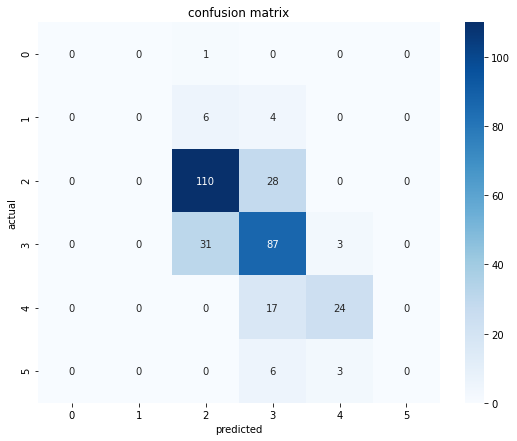

In [40]:
import seaborn as sns
plt.figure(figsize=(9,7))
sns.heatmap(cm,annot=True,fmt="d",cmap="Blues")
plt.xlabel("predicted")
plt.ylabel("actual")
plt.title("confusion matrix")
plt.show()

In [46]:
mean_absolute_error(y_test,y_test_pred)

0.34375

In [49]:
np.sqrt(mean_squared_error(y_test,y_test_pred))

0.6422616289332564

In [55]:
from sklearn.metrics import f1_score, precision_score, recall_score

In [57]:
f1_score(y_test,y_test_pred, average='micro')

0.690625

In [58]:
f1_score(y_test,y_test_pred, average='macro')

0.35114734423897387

In [59]:
f1_score(y_test,y_test_pred, average='weighted')

0.6685168373505144